# Introduction
Each year, 1.35 million people are killed on roadways around the world.    Every day, almost 3,700 people are killed globally in road traffic crashes involving cars, buses, motorcycles, bicycles, trucks, or pedestrians. More than half of those killed are pedestrians, motorcyclists, and cyclists. In USA in 2019, an estimated 38,800 people lost their lives to car crashes and about 4.4 million people were injured seriously enough to require medical attention in crashes.
In this project I will try to find the factors which can lead to an accident and how the severity of the accident is affected by them and if there are areas where accidents are more likely to happen


# Data Understanding
The dataset has 221525 rows and 40 different variables. We will take 
Severity Code to be our dependent variable and various variables will be used as our independent variables. The data is quite large and has a lot of missing values that will have to be treated and variables will have to   be dropped.

The dependent variable has 5 values:-

1. 0 -Unknown
2. 1 -Prop Damage
3. 2 -Injury
4. 2b-Serious Injury
5. 3 -Fatality
  
Other important variables are: -
1.	X and Y <br>
The longitude and latitude of the accident
2.	ADDRTYPE <br>
Collision Address type: -<br>
•	Alley <br>
•	Block<br>
•	Intersection<br>
3.	SEVERITYDESC <br>
A detailed description of the severity of the collision
4.	COLLISIONTYPE<br>
The type of collision
5.	PERSONCOUNT<br>
The total number of people involved in the collision
6.	PEDCOUNT<br>
The number of pedestrians involved in the collision
7.	PEDCYLCOUNT<br>
The number of bicycles involved in the collision
8.	VEHCOUNT<br>
The number of vehicles involved in the collision
9.	INJURIES<br>
The number of total injuries in the collision

10.	SERIOUSINJURIES<br>
The number of serious injuries in the collision. This is entered by       the state
11.	FATALITIES<br>
 The number of fatalities in the collision

12.	INCDATE<br>
 The date of the incident
13.	INCDTTM<br>
  The date and time of the incident
14.	JUNCTIONTYPE<br>
 Category of junction at which collision took place
15.	INATTENTIONIND<br>
 Whether or not collision was due to inattention
16.	UNDERINFL<br>
 Whether or not a driver involved was under the influence of drugs or alcohol
17.	ROADCOND<br>
 The condition of the road during the collision
18.	LIGHTCOND<br>
 The light conditions during the collision
19.	PEDROWNOTGRNT<br>
 Whether or not the pedestrian right of way was not granted
20.	SPEEDING<br>
 Whether or not speeding was a factor in the collision.
21.	HITPARKEDCAR<br>
 Whether or not the collision involved hitting a parked car.


In [1]:
# import libraries
import pandas as pd
import numpy as np
#
import folium
from folium.plugins import HeatMap
#
import matplotlib.pyplot as plt
import seaborn as sns
#
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
#
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

# Reading the Data

In [2]:

df_collision = pd.read_csv('C:/Users/HP/Desktop/python/IBM/Collisions.csv')

C:\Users\HP\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (35) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# UNderstanding the data

In [3]:
df_collision.head()

,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,-122.344896,47.717173,1,1003,1003,3503158,Matched,Block,NaN,AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST,...,Dry,Daylight,Y,NaN,NaN,45,Vehicle - Pedalcyclist,15057,0,N
1,-122.376467,47.543774,2,56200,56200,1795087,Matched,Block,NaN,35TH AVE SW BETWEEN SW MORGAN ST AND SW HOLLY ST,...,Dry,Dark - Street Lights On,NaN,6015003.0,NaN,0,Vehicle going straight hits pedestrian,0,0,N
2,-122.360735,47.701487,3,327037,328537,E979380,Matched,Intersection,37122.0,3RD AVE NW AND NW 100TH ST,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
3,-122.297415,47.599233,4,327278,328778,E996362,Unmatched,Intersection,30602.0,M L KING JR WAY S AND S JACKSON ST,...,NaN,NaN,NaN,NaN,NaN,,NaN,0,0,N
4,-122.368001,47.653585,5,1248,1248,3645424,Unmatched,Block,NaN,W EWING ST BETWEEN 6TH AVE W AND W EWING PL,...,NaN,NaN,NaN,NaN,NaN,,NaN,0,0,N


In [4]:
df_collision.shape

(221525, 40)

In [5]:
df_collision.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221525 entries, 0 to 221524
Data columns (total 40 columns):
X                  214050 non-null float64
Y                  214050 non-null float64
OBJECTID           221525 non-null int64
INCKEY             221525 non-null int64
COLDETKEY          221525 non-null int64
REPORTNO           221525 non-null object
STATUS             221525 non-null object
ADDRTYPE           217813 non-null object
INTKEY             71936 non-null float64
LOCATION           216935 non-null object
EXCEPTRSNCODE      101122 non-null object
EXCEPTRSNDESC      11779 non-null object
SEVERITYCODE       221524 non-null object
SEVERITYDESC       221525 non-null object
COLLISIONTYPE      195212 non-null object
PERSONCOUNT        221525 non-null int64
PEDCOUNT           221525 non-null int64
PEDCYLCOUNT        221525 non-null int64
VEHCOUNT           221525 non-null int64
INJURIES           221525 non-null int64
SERIOUSINJURIES    221525 non-null int64
FATALITIES     

In [6]:
df_collision.isnull().sum()

X                    7475
Y                    7475
OBJECTID                0
INCKEY                  0
COLDETKEY               0
REPORTNO                0
STATUS                  0
ADDRTYPE             3712
INTKEY             149589
LOCATION             4590
EXCEPTRSNCODE      120403
EXCEPTRSNDESC      209746
SEVERITYCODE            1
SEVERITYDESC            0
COLLISIONTYPE       26313
PERSONCOUNT             0
PEDCOUNT                0
PEDCYLCOUNT             0
VEHCOUNT                0
INJURIES                0
SERIOUSINJURIES         0
FATALITIES              0
INCDATE                 0
INCDTTM                 0
JUNCTIONTYPE        11974
SDOT_COLCODE            1
SDOT_COLDESC            1
INATTENTIONIND     191337
UNDERINFL           26293
WEATHER             26503
ROADCOND            26422
LIGHTCOND           26592
PEDROWNOTGRNT      216330
SDOTCOLNUM          94320
SPEEDING           211596
ST_COLCODE           9413
ST_COLDESC          26313
SEGLANEKEY              0
CROSSWALKKEY

In [7]:
# Removal of variables that were of no use to my work and those which had an excessive amount of missing values
# Rest of the variables with missing values will be treated later in order to save data
df_collision.drop(['OBJECTID','INCKEY','COLDETKEY','REPORTNO','STATUS','INTKEY','LOCATION','EXCEPTRSNCODE',
                   'EXCEPTRSNDESC','SDOT_COLCODE','SDOTCOLNUM','ST_COLCODE','ST_COLDESC','SEGLANEKEY','INATTENTIONIND',
                  'PEDROWNOTGRNT','SPEEDING','CROSSWALKKEY','INCDATE','SEVERITYDESC'], axis = 1,inplace = True)

In [8]:
df_collision.head()

,X,Y,ADDRTYPE,SEVERITYCODE,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INJURIES,SERIOUSINJURIES,FATALITIES,INCDTTM,JUNCTIONTYPE,SDOT_COLDESC,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,HITPARKEDCAR
0,-122.344896,47.717173,Block,2,Cycles,2,0,1,1,1,0,0,3/14/2013 5:30:00 PM,Driveway Junction,"MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END A...",N,Clear,Dry,Daylight,N
1,-122.376467,47.543774,Block,2,Pedestrian,7,1,0,1,1,0,0,1/15/2006 5:35:00 PM,Mid-Block (not related to intersection),MOTOR VEHCILE STRUCK PEDESTRIAN,0,Overcast,Dry,Dark - Street Lights On,N
2,-122.360735,47.701487,Intersection,1,Angles,2,0,0,2,0,0,0,09-09-2019 15:32,At Intersection (intersection related),"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",N,Overcast,Wet,Daylight,N
3,-122.297415,47.599233,Intersection,1,NaN,2,0,0,0,0,0,0,12/19/2019,At Intersection (intersection related),"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",NaN,NaN,NaN,NaN,N
4,-122.368001,47.653585,Block,0,NaN,1,0,0,0,0,0,0,3/27/2013,Mid-Block (not related to intersection),NOT ENOUGH INFORMATION / NOT APPLICABLE,NaN,NaN,NaN,NaN,N


In [9]:
df_collision.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221525 entries, 0 to 221524
Data columns (total 20 columns):
X                  214050 non-null float64
Y                  214050 non-null float64
ADDRTYPE           217813 non-null object
SEVERITYCODE       221524 non-null object
COLLISIONTYPE      195212 non-null object
PERSONCOUNT        221525 non-null int64
PEDCOUNT           221525 non-null int64
PEDCYLCOUNT        221525 non-null int64
VEHCOUNT           221525 non-null int64
INJURIES           221525 non-null int64
SERIOUSINJURIES    221525 non-null int64
FATALITIES         221525 non-null int64
INCDTTM            221525 non-null object
JUNCTIONTYPE       209551 non-null object
SDOT_COLDESC       221524 non-null object
UNDERINFL          195232 non-null object
WEATHER            195022 non-null object
ROADCOND           195103 non-null object
LIGHTCOND          194933 non-null object
HITPARKEDCAR       221525 non-null object
dtypes: float64(2), int64(7), object(11)
memory usage:

In [10]:
df_collision.isnull().sum()

X                   7475
Y                   7475
ADDRTYPE            3712
SEVERITYCODE           1
COLLISIONTYPE      26313
PERSONCOUNT            0
PEDCOUNT               0
PEDCYLCOUNT            0
VEHCOUNT               0
INJURIES               0
SERIOUSINJURIES        0
FATALITIES             0
INCDTTM                0
JUNCTIONTYPE       11974
SDOT_COLDESC           1
UNDERINFL          26293
WEATHER            26503
ROADCOND           26422
LIGHTCOND          26592
HITPARKEDCAR           0
dtype: int64

In [11]:
# Converting the variable 'INCDTTM' into a pandas readable format
df_collision['INCDTTM'] = pd.to_datetime(df_collision['INCDTTM'])

In [12]:
df_collision['UNDERINFL'].value_counts()

N    103927
0     81676
Y      5399
1      4230
Name: UNDERINFL, dtype: int64

In [13]:
df_collision.replace({'UNDERINFL':{'Y':1,'1':1,'N':0,'0':0}}, inplace = True)

In [14]:
df_collision['UNDERINFL'].value_counts()

0.0    185603
1.0      9629
Name: UNDERINFL, dtype: int64

# Data Visualisation

## Mapping

In [15]:
# Seperate dataframe to use during the data visualisation using maps
df_map = df_collision[['X','Y','INCDTTM','VEHCOUNT','PEDCYLCOUNT','HITPARKEDCAR','UNDERINFL']]

In [16]:
df_map.isnull().sum()

X                7475
Y                7475
INCDTTM             0
VEHCOUNT            0
PEDCYLCOUNT         0
HITPARKEDCAR        0
UNDERINFL       26293
dtype: int64

In [17]:
df_map.dropna(subset = ['X'],inplace = True)

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [18]:
df_map.shape

(214050, 7)

In [19]:
df_map['coordinates'] = df_map.apply(lambda x: [x['Y'],x['X']], axis = 1)

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [20]:
df_map['year'] = df_map['INCDTTM'].dt.year

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [21]:
# Here we can see that our data ranges from October 2003 to September 2020
df_map['INCDTTM'].min(),df_map['INCDTTM'].max()

(Timestamp('2003-10-06 00:00:00'), Timestamp('2020-09-15 00:00:00'))

# Overall


In [22]:
# Creating a layered heatmap for a year by year analysis
smap = folium.Map([47.6062,-122.3321],zoom_start = 10)
data =[0]*16
for index,i in enumerate(range(2004,2020)):
    data[index] = df_map['coordinates'][df_map['year'] == i].as_matrix()
for i in range(16):
    HeatMap(data[i], radius =5, gradient = {0.4: 'blue', 0.65: 'lime', 1: 'red'} ).add_to(folium.FeatureGroup(name = 'layer'+str(i+2004)).add_to(smap))

folium.LayerControl().add_to(smap)    

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """


In [23]:
smap

# Cycle related

In [24]:
ccdata = df_map['coordinates'][(df_map['PEDCYLCOUNT']>0)].as_matrix()
sccmap = folium.Map([47.6062,-122.3321],zoom_start = 10)
HeatMap(ccdata, radius = 15,min_opacity = 0.02).add_to(sccmap)
sccmap

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [25]:
cdata = [0]*16

In [26]:
for index, i in enumerate(range(2004,2020)):
    cdata[index] = df_map['coordinates'][(df_map['year'] == i) & (df_map['PEDCYLCOUNT']>0)].as_matrix()

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


In [27]:
scmap = folium.Map([47.6062,-122.3321],zoom_start = 10)
for i in range(16):    
    HeatMap(cdata[i], radius =10, gradient = {0.4: 'blue', 0.65: 'lime', 1: 'red'} ).add_to(folium.FeatureGroup(name = 'cycle layer'+str(i+2004)).add_to(scmap))
folium.LayerControl().add_to(scmap)
scmap

# Parked Cars

In [28]:
df_map['HITPARKEDCAR'].value_counts()

N    202339
Y     11711
Name: HITPARKEDCAR, dtype: int64

In [29]:
ppmap = folium.Map([47.6062,-122.3321],zoom_start = 10)
ppdata = df_map['coordinates'][df_map['HITPARKEDCAR'] == 'Y'].as_matrix()
HeatMap(ppdata, radius = 12, min_opacity =0.02).add_to(ppmap)
ppmap

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


# Under Influence

In [30]:
uidata = df_map['coordinates'][(df_map['UNDERINFL'] == 1) & (df_map['VEHCOUNT'] > 0 )].as_matrix()
uimap = folium.Map([47.6062,-122.3321],zoom_start = 10)
HeatMap(uidata, radius = 15, min_opacity = 0.02).add_to(uimap)
uimap

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


# Graphing

In [31]:
# Seperate dataframe to be used for data visualisation using graphs
df_graph = df_collision[['INCDTTM', 'FATALITIES', 'COLLISIONTYPE','PEDCYLCOUNT', 'VEHCOUNT', 'ADDRTYPE']]

In [32]:
df_graph.head()

,INCDTTM,FATALITIES,COLLISIONTYPE,PEDCYLCOUNT,VEHCOUNT,ADDRTYPE
0,2013-03-14 17:30:00,0,Cycles,1,1,Block
1,2006-01-15 17:35:00,0,Pedestrian,0,1,Block
2,2019-09-09 15:32:00,0,Angles,0,2,Intersection
3,2019-12-19 00:00:00,0,NaN,0,0,Intersection
4,2013-03-27 00:00:00,0,NaN,0,0,Block


In [33]:
df_graph.isnull().sum()

INCDTTM              0
FATALITIES           0
COLLISIONTYPE    26313
PEDCYLCOUNT          0
VEHCOUNT             0
ADDRTYPE          3712
dtype: int64

In [34]:
df_graph['year'] = df_graph['INCDTTM'].dt.year

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [35]:
df_a = pd.DataFrame(df_graph['year'].value_counts())

In [36]:
df_a.sort_index(inplace = True)

In [37]:
df_a = df_a[(df_a.index>2003) & (df_a.index<2020)]

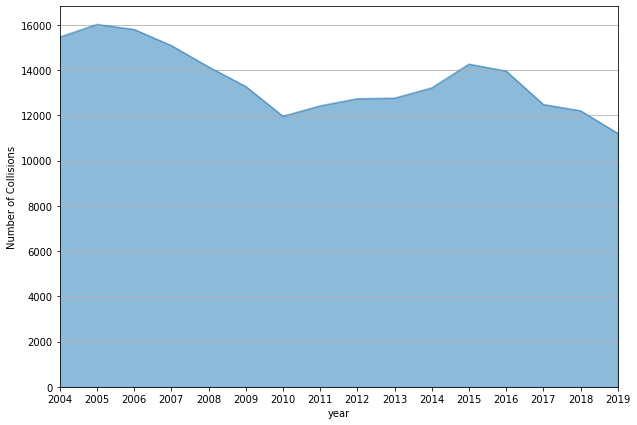

In [38]:
plt.figure(figsize = (10,7))
plt.xlabel('year')
plt.ylabel('Number of Collisions')
plt.xticks(range(2004,2021))

df_a['year'].plot(kind= 'area',alpha = 0.5)
plt.grid(axis = 'y')

In [39]:
df_f = pd.DataFrame(df_graph['FATALITIES'].groupby(df_graph['year']).sum())

In [40]:
df_f = df_f[(df_f.index>2003) & (df_f.index<2020)]

In [41]:
df_f

,FATALITIES
year,
2004,30
2005,30
2006,42
2007,14
2008,20
2009,24
2010,20
2011,11
2012,22


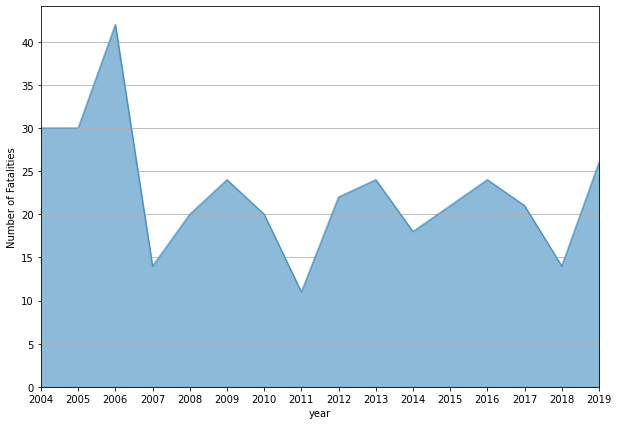

In [42]:
plt.figure(figsize = (10,7))
plt.xlabel('year')
plt.ylabel('Number of Fatalities')
plt.xticks(range(2004,2021))

df_f['FATALITIES'].plot(kind= 'area',alpha = 0.5)
plt.grid(axis = 'y')

In [43]:
df_t = pd.DataFrame()
df_t['2004-2019'] = df_graph['INCDTTM'].dt.hour
df_t['year'] = df_graph['INCDTTM'].dt.year
df_time = pd.DataFrame(df_t['2004-2019'].value_counts())
df_time['2019'] = df_t['2004-2019'][df_t['year'] == 2019].value_counts()
df_time.sort_index(inplace = True)
df_time.drop(0, axis = 0, inplace = True)

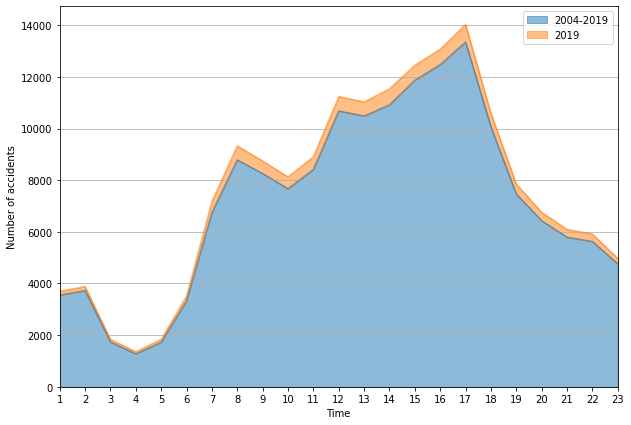

In [44]:
df_time.plot(kind = 'area', alpha = 0.5,figsize = (10,7))
plt.grid(axis ='y')
plt.xlabel('Time')
plt.ylabel('Number of accidents')
plt.title('')
plt.xticks(range(1,24))
plt.show()

In [45]:
df_graph['weekday'] = df_graph['INCDTTM'].dt.weekday

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [46]:
df_day = pd.DataFrame(df_graph['weekday'].value_counts())

In [47]:
df_day['2019'] = df_graph['weekday'][df_graph['year'] == 2019].value_counts()
df_day.sort_index(inplace = True)

In [48]:
df_day['day'] = ['Monday','Tuesday','Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

In [49]:
df_day.set_index(['day'],inplace = True)

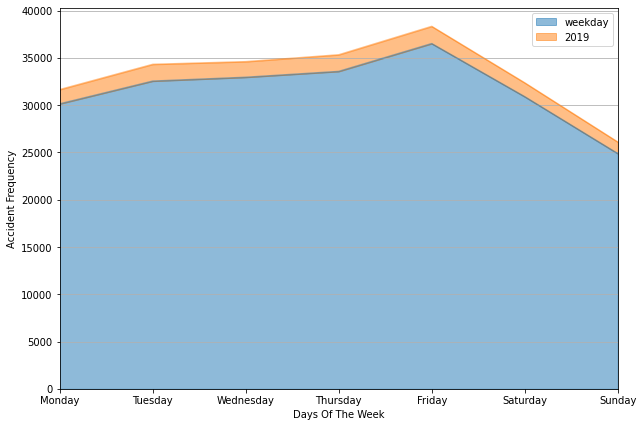

In [50]:

df_day.plot(kind = 'area', alpha = 0.5, figsize = (10,7), use_index = True)

plt.grid(axis = 'y')
plt.xlabel('Days Of The Week')
plt.ylabel('Accident Frequency')
plt.title('')
plt.show()

In [51]:
df_graph.dropna(inplace = True)

C:\Users\HP\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [52]:
df_graph.isnull().sum()

INCDTTM          0
FATALITIES       0
COLLISIONTYPE    0
PEDCYLCOUNT      0
VEHCOUNT         0
ADDRTYPE         0
year             0
weekday          0
dtype: int64

Text(0, 0.5, '')

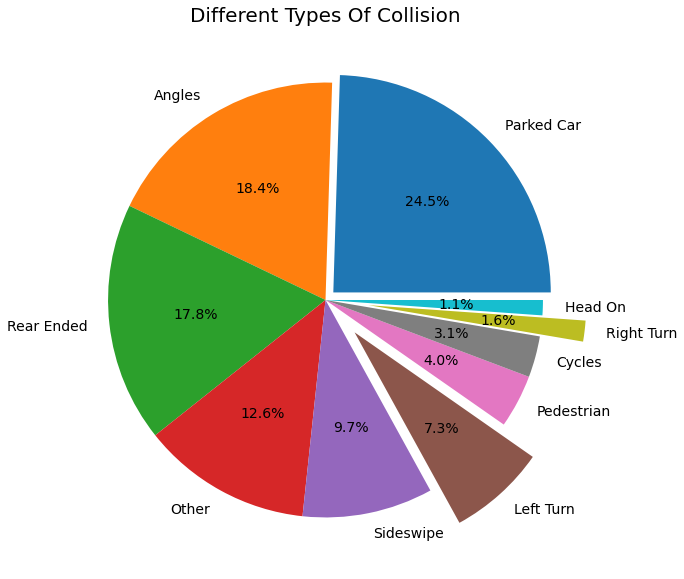

In [53]:
df_graph['COLLISIONTYPE'].value_counts().plot.pie(figsize = (15,10),
                                                  explode =(0.05,0,0,0,0,0.2,0,0,0.2,0),
                                                  autopct='%1.1f%%',
                                                  fontsize = 14
                                                 )
plt.title('Different Types Of Collision', fontsize = 20)
plt.ylabel('')


C:\Users\HP\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\HP\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\HP\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
C:\Users\HP\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.

Text(0, 0.5, '')

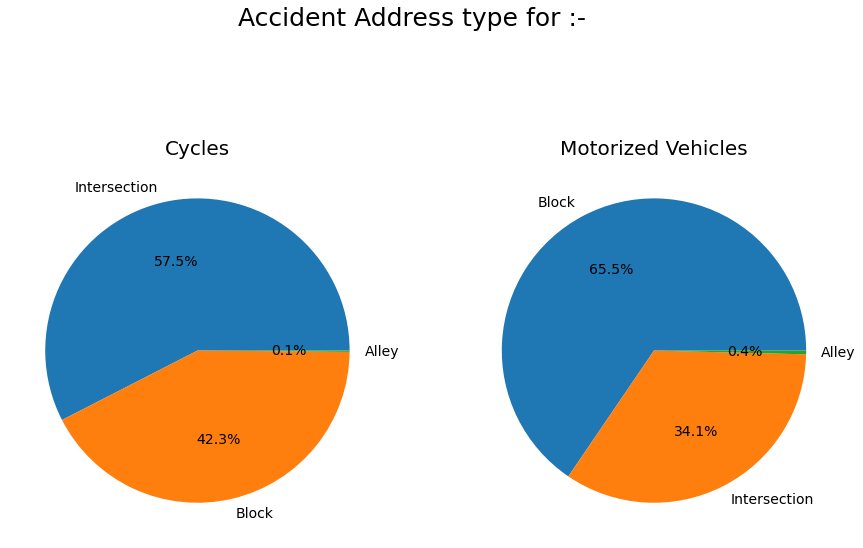

In [54]:
fig = plt.figure()
ax0 = fig.add_subplot(1,2,1)
ax1 = fig.add_subplot(1,2,2)
fig.suptitle('Accident Address type for :-', fontsize = 25, fontweight = 32)
df_graph['ADDRTYPE'][df_graph['PEDCYLCOUNT'] > 0].value_counts().plot.pie(figsize= (15,10),
                                                                          autopct = '%1.1f%%', fontsize = 14, ax = ax0)
ax0.set_title('Cycles', fontsize = 20)
ax0.set_ylabel('')
df_graph['ADDRTYPE'][df_graph['VEHCOUNT'] > 0].value_counts().plot.pie(figsize= (15,10),
                                                                       autopct = '%1.1f%%', fontsize = 14, ax = ax1)
ax1.set_title('Motorized Vehicles' , fontsize = 20)
ax1.set_ylabel('')

# Machine Learning


In [55]:
df_collision.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221525 entries, 0 to 221524
Data columns (total 20 columns):
X                  214050 non-null float64
Y                  214050 non-null float64
ADDRTYPE           217813 non-null object
SEVERITYCODE       221524 non-null object
COLLISIONTYPE      195212 non-null object
PERSONCOUNT        221525 non-null int64
PEDCOUNT           221525 non-null int64
PEDCYLCOUNT        221525 non-null int64
VEHCOUNT           221525 non-null int64
INJURIES           221525 non-null int64
SERIOUSINJURIES    221525 non-null int64
FATALITIES         221525 non-null int64
INCDTTM            221525 non-null datetime64[ns]
JUNCTIONTYPE       209551 non-null object
SDOT_COLDESC       221524 non-null object
UNDERINFL          195232 non-null float64
WEATHER            195022 non-null object
ROADCOND           195103 non-null object
LIGHTCOND          194933 non-null object
HITPARKEDCAR       221525 non-null object
dtypes: datetime64[ns](1), float64(3), int64(

In [56]:
df_collision.drop(['X','Y','INJURIES','SERIOUSINJURIES','FATALITIES'],axis = 1, inplace = True)


In [57]:
df_collision.isnull().sum()

ADDRTYPE          3712
SEVERITYCODE         1
COLLISIONTYPE    26313
PERSONCOUNT          0
PEDCOUNT             0
PEDCYLCOUNT          0
VEHCOUNT             0
INCDTTM              0
JUNCTIONTYPE     11974
SDOT_COLDESC         1
UNDERINFL        26293
WEATHER          26503
ROADCOND         26422
LIGHTCOND        26592
HITPARKEDCAR         0
dtype: int64

In [58]:
df_collision.dropna(inplace = True)

In [59]:
print ('Number of rows left after missing value treatment:',df_collision.shape[0])

Number of rows left after missing value treatment: 188255


In [60]:
df_collision['month'] = df_collision['INCDTTM'].dt.month
df_collision['hour'] = df_collision['INCDTTM'].dt.hour

df_collision.drop(['INCDTTM'], axis = 1, inplace = True)

In [61]:
# changing the data types of non integer variales
column_list = ['SEVERITYCODE','COLLISIONTYPE','ADDRTYPE','JUNCTIONTYPE','SDOT_COLDESC','WEATHER','ROADCOND','LIGHTCOND','HITPARKEDCAR']
for i in column_list:
    le = preprocessing.LabelEncoder()
    df_collision[i] = le.fit_transform(df_collision[i])
df_collision['UNDERINFL'] = df_collision['UNDERINFL'].astype(int)    

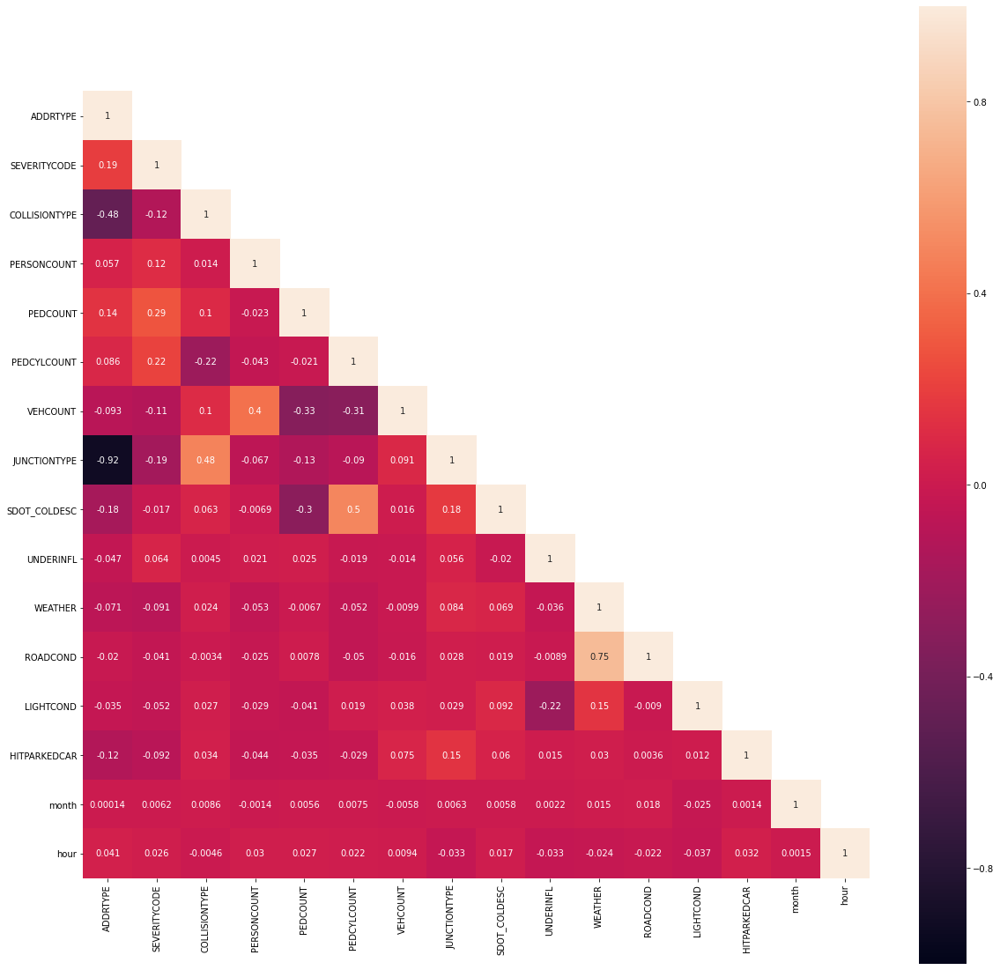

In [62]:
cor = df_collision.corr()
mask = np.array(cor)
mask[np.tril_indices_from(mask)] = False
plt.figure(figsize = (20,20))
sns.heatmap(cor, mask = mask, square = True, annot = True, clip_on = False, vmin = -1)

In [63]:
X = df_collision.copy()
X = X[X['SEVERITYCODE'] != 0]
y = X['SEVERITYCODE']

In [64]:
X.drop(['SEVERITYCODE'],
       axis =1, inplace = True)

In [65]:
print('The list of columns to be used for machine learning:')
print(X.columns.to_list())

The list of columns to be used for machine learning:
['ADDRTYPE', 'COLLISIONTYPE', 'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'JUNCTIONTYPE', 'SDOT_COLDESC', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'HITPARKEDCAR', 'month', 'hour']


In [66]:
X.values
y.values
x_train, x_test, y_train, y_test = train_test_split( X , y , test_size = 0.2 , random_state = 3 )

In [67]:
print('Size of train set:',x_train.shape)
print('size of test set:', x_test.shape)

Size of train set: (150603, 15)
size of test set: (37651, 15)


In [68]:
# percentage of severity code values in the base dataset
y.value_counts()/len(y)

1    0.677600
2    0.304509
3    0.016095
4    0.001795
Name: SEVERITYCODE, dtype: float64

In [69]:
# percentage of severity code values in train set
y_train.value_counts()/len(y_train)

1    0.677596
2    0.304509
3    0.016075
4    0.001819
Name: SEVERITYCODE, dtype: float64

In [70]:
# percentage of severity code values in test set
y_test.value_counts()/len(y_test)

1    0.677618
2    0.304507
3    0.016175
4    0.001700
Name: SEVERITYCODE, dtype: float64

# Decision Tree

In [71]:
dtc = DecisionTreeClassifier(max_depth = 7, criterion = 'entropy')

In [72]:
dtc.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=7,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [73]:
print('The score for train set:',dtc.score(x_train,y_train))
print('The score for test set:',dtc.score(x_test,y_test))

The score for train set: 0.738783423968978
The score for test set: 0.7352261560117925


In [74]:
dtc_prediction = dtc.predict(x_test)

In [75]:
print(classification_report(y_test,dtc_prediction))


              precision    recall  f1-score   support

           1       0.74      0.97      0.84     25513
           2       0.73      0.26      0.38     11465
           3       0.00      0.00      0.00       609
           4       0.00      0.00      0.00        64

    accuracy                           0.74     37651
   macro avg       0.37      0.31      0.30     37651
weighted avg       0.72      0.74      0.68     37651



# K Nearest Neighbour

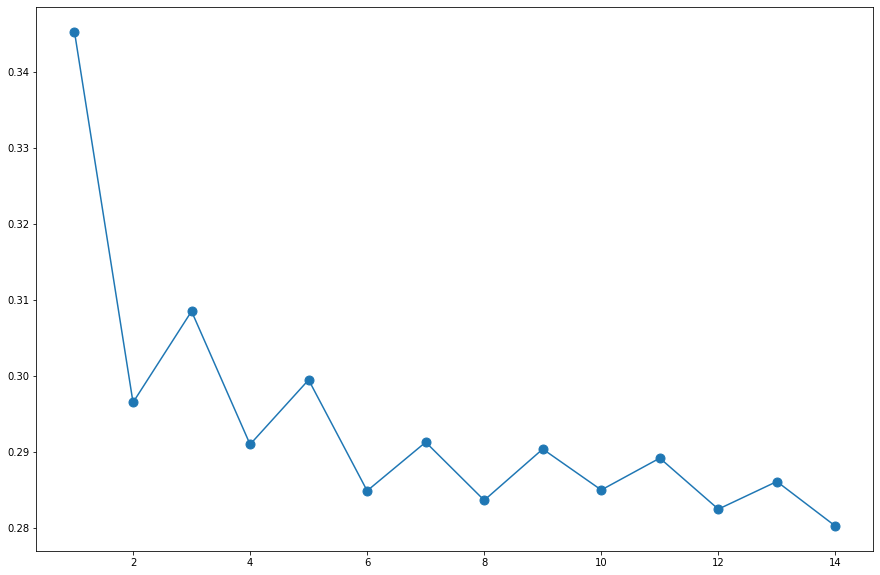

In [76]:
error_rate = []

for i in range(1,15):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train, y_train)
    pred = knn.predict(x_test)
    error_rate.append(np.mean(pred != y_test))

plt.figure(figsize=(15,10))
plt.plot(range(1,15),error_rate, marker='o', markersize=9)

The elbow point can be seen at the value of n_neighbhors=6

In [77]:
knn = KNeighborsClassifier(n_neighbors = 6)
knn.fit(x_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=6, p=2,
                     weights='uniform')

In [78]:
print('The score for train set:',knn.score(x_train,y_train))
print('The score for test set:',knn.score(x_test,y_test))

The score for train set: 0.7648851616501663
The score for test set: 0.7150938886085363


In [79]:
knn_prediction = knn.predict(x_test)

In [80]:
print(classification_report(y_test,knn_prediction))

              precision    recall  f1-score   support

           1       0.74      0.91      0.82     25513
           2       0.58      0.33      0.42     11465
           3       0.10      0.00      0.01       609
           4       0.00      0.00      0.00        64

    accuracy                           0.72     37651
   macro avg       0.36      0.31      0.31     37651
weighted avg       0.68      0.72      0.68     37651



C:\Users\HP\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


# Naive Bayes

In [81]:
nb = GaussianNB()

In [82]:
nb.fit(x_train,y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [83]:
print('The score for train set:',nb.score(x_train,y_train))
print('The score for test set:',nb.score(x_test,y_test))

The score for train set: 0.6563083072714355
The score for test set: 0.6549095641550026


In [84]:
nb_prediction = nb.predict(x_test)

In [85]:
print(classification_report(y_test,nb_prediction))

              precision    recall  f1-score   support

           1       0.73      0.93      0.82     25513
           2       0.63      0.07      0.13     11465
           3       0.10      0.07      0.08       609
           4       0.01      0.56      0.02        64

    accuracy                           0.65     37651
   macro avg       0.37      0.41      0.26     37651
weighted avg       0.69      0.65      0.60     37651



# Result

In [92]:
f_score = []
j_score = []
pred = [dtc_prediction,knn_prediction,nb_prediction]
for i in pred:
    f_score.append(f1_score(y_test, i, average = 'weighted'))
for i in pred:
    j_score.append(jaccard_score(y_test,i, average = 'weighted'))
df_report = pd.DataFrame(f_score, index = ['Decision Tree', 'K Nearest Neighbor', 'Naive Bayes'])
df_report.columns = ['f1_score_weighted']
df_report['Jaccard Score '] = j_score
df_report.columns.name = 'Algorithm'
df_report

Algorithm,f1_score_weighted,Jaccard Score
Decision Tree,0.682718,0.581310
K Nearest Neighbor,0.681620,0.556534
Naive Bayes,0.596810,0.486889
